# Lab assignment 1: Classification
+ Ana Rotella Fernandez
+ Marta Simón Pinacho
+ Ana Miguélez Martínez

In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
### Load necessary modules -------------------------------
# interactive plotting
%matplotlib inline
%config InlineBackend.figure_format = 'svg' # ‘png’, ‘retina’, ‘jpeg’, ‘svg’, ‘pdf’

# plotting libraries
import seaborn as sns
import matplotlib.pyplot as plt
sns.set()

# Data management libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Machine learning libraries
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.compose import ColumnTransformer

# Other
from mltools import classification_tools as CT
from mltools import model_tools as MT

## 1. Exploratory Data Analysis (EDA)

### STEP 1: IMPORT DATASET

In [72]:
### Load file --------------------------------------------
diabetes = pd.read_csv('Diabetes.csv', sep = ";")
diabetes

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


### STEP 2: CHECK OUT THE MISSING VALUES

In [73]:
### Info and type of variables & missing, veo cuantos valores non-null para todos los variables
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   PREGNANT       768 non-null    int64  
 1   GLUCOSE        768 non-null    int64  
 2   BLOODPRESS     768 non-null    int64  
 3   SKINTHICKNESS  768 non-null    int64  
 4   INSULIN        768 non-null    int64  
 5   BODYMASSINDEX  768 non-null    float64
 6   PEDIGREEFUNC   768 non-null    float64
 7   AGE            768 non-null    int64  
 8   DIABETES       768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [74]:
# How many NAs?
print('Number of NAs in dataframe:',diabetes.isnull().values.sum()) 
diabetes.isnull().any() # Are there any NAs? No,there are not any NAs

Number of NAs in dataframe: 0


PREGNANT         False
GLUCOSE          False
BLOODPRESS       False
SKINTHICKNESS    False
INSULIN          False
BODYMASSINDEX    False
PEDIGREEFUNC     False
AGE              False
DIABETES         False
dtype: bool

### STEP 3: PLOT THE DATA AND CHECK OUT FOR OUTLIERS

In [75]:
diabetes.describe()

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


### Functions to obtain outliers, drop outliers, generate histograms and boxplots for each variable

In [76]:
# FUNCIÓN PARA OBTENER OUTLIERS
def outliers (datos):
    df_iqr = stats.iqr(datos)
    print(f"Rango intercuartílico: {df_iqr}")
    # Para localizar el primer y tercer cuartil.
    df_q1, df_q3 = np.quantile(datos, [0.25, 0.75])
 
    # Limites de los valores atípicos
    cut_low = df_q1 - 1.5 * df_iqr
    cut_high = df_q3 + 1.5 * df_iqr
 
    print("Lower and upper outlier limits:", cut_low, ", ", cut_high)
 
    # Obtenemos de nuestro dataset todos los valores atípicos segun los limites calculados
    df_outliers = diabetes.loc[(datos < cut_low) | (datos > cut_high)]

    # Representación mediante boxpots (sección gráficos)

    print('We have a total of', len(df_outliers), 'outliers')

    return df_outliers

In [103]:
# FUNCION PARA ELIMINAR OUTLIERS
def drop_outliers(df_outliers):
    df_outliers_index = df_outliers.index
    # ignoramos los errores para evitar borrar una misma fila (outliers en varias variables) dos veces
    diabetes.drop(index = df_outliers_index, inplace = True, errors='ignore')
    print("Outliers deleted.")

In [78]:
# FUNCIÓN PARA OBTENER UN BOXPLOT CON DIABETES=0 Y DIABETES=1
def boxplt (column, title, by=1):
    if by == 1:
        diabetes.plot.box(column=column, by = 'DIABETES')
    else:
        diabetes.plot.box(column=column)
    plt.xlabel('DIABETES', fontdict={'fontsize':20})
    plt.ylabel(column, fontdict={'fontsize':20})
    plt.title(title, fontdict={'fontsize':25})
    plt.show()

In [79]:
def hist_densplt(column, title):
    sns.set()
    dens_plot = sns.histplot(data = diabetes, x = column, kde=True)
    plt.title(title, fontdict={'fontsize':25})
    dens_plot.lines[0].set_color('red')
    dens_plot.lines[0].set_linewidth(3)

## PREGNANT

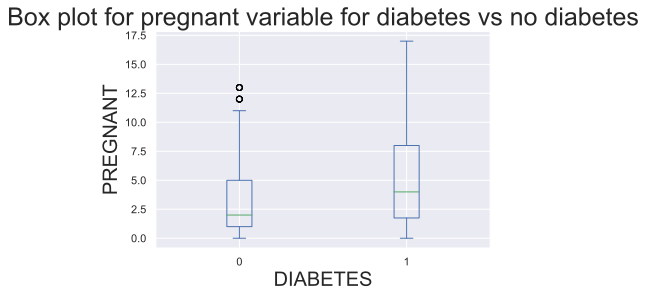

In [80]:
# Boxplot
pregnant_boxplt = boxplt('PREGNANT', 'Box plot for pregnant variable for diabetes vs no diabetes')

In [81]:
# Outliers
pregnant_outl = outliers(diabetes.PREGNANT)
pregnant_outl

Rango intercuartílico: 5.0
Lower and upper outlier limits: -6.5 ,  13.5
We have a total of 4 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
88,15,136,70,32,110,37.1,0.153,43,1
159,17,163,72,41,114,40.9,0.817,47,1
298,14,100,78,25,184,36.6,0.412,46,1
455,14,175,62,30,0,33.6,0.212,38,1


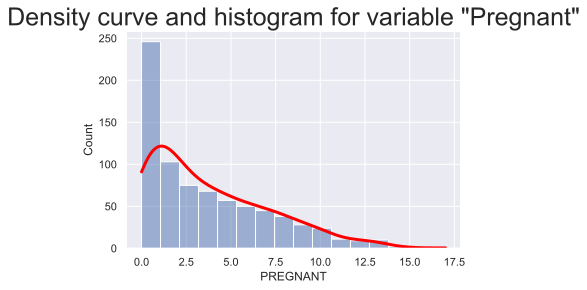

In [82]:
pregnant_histplt = hist_densplt('PREGNANT', 'Density curve and histogram for variable "Pregnant"')

**Conclusión de los outliers para PREGNANT**


La mayoría de los casos se dan en 0, 1 y 2 embarazos, como podemos ver en el histograma. 0 embarazos es normal, y 17 embarazos no es muy probable, pero también se puede dar el caso.


Al tratarse de valores que se pueden dar en casos reales, hemos decidido no eliminar o sustituir los outliers por otros valores.

## GLUCOSE

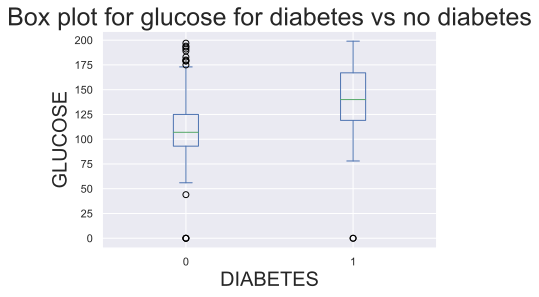

In [83]:
# Boxplot
glucose_boxplt = boxplt('GLUCOSE', 'Box plot for glucose for diabetes vs no diabetes')

In [84]:
# Outliers
glucose_outl = outliers(diabetes.GLUCOSE)
glucose_outl

Rango intercuartílico: 41.25
Lower and upper outlier limits: 37.125 ,  202.125
We have a total of 5 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
75,1,0,48,20,0,24.7,0.140,22,0
182,1,0,74,20,23,27.7,0.299,21,0
342,1,0,68,35,0,32.0,0.389,22,0
349,5,0,80,32,0,41.0,0.346,37,1
502,6,0,68,41,0,39.0,0.727,41,1


El bajo nivel de azúcar en la sangre grave es una emergencia médica. Puede ocasionar crisis epilépticas y daño cerebral.
Al nivel de azúcar en la sangre por debajo de los 70 mg/dL se lo considera bajo.

Por lo que en esta variable hemos decidido eliminar los outliers, ya que un valor de glucosa igual a 0 es imposible.

## BLOODPRESS

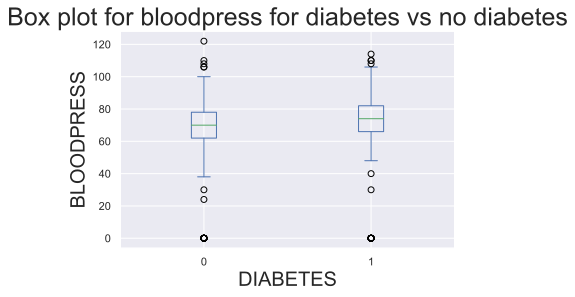

In [85]:
# Boxplot
bloodpress_boxplt = boxplt('BLOODPRESS', 'Box plot for bloodpress for diabetes vs no diabetes')

In [86]:
# Outliers
bloodpress_outl = outliers(diabetes.BLOODPRESS)
bloodpress_outl

Rango intercuartílico: 18.0
Lower and upper outlier limits: 35.0 ,  107.0
We have a total of 45 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
7,10,115,0,0,0,35.3,0.134,29,0
15,7,100,0,0,0,30.0,0.484,32,1
18,1,103,30,38,83,43.3,0.183,33,0
43,9,171,110,24,240,45.4,0.721,54,1
49,7,105,0,0,0,0.0,0.305,24,0
60,2,84,0,0,0,0.0,0.304,21,0
78,0,131,0,0,0,43.2,0.270,26,1
81,2,74,0,0,0,0.0,0.102,22,0
84,5,137,108,0,0,48.8,0.227,37,1
106,1,96,122,0,0,22.4,0.207,27,0


En la variable `BLOODPRESS` el mínimo es 0, esto significa que la presión arterial demasiado baja, lo que puede provocar la disminución de los niveles de oxígeno del cuerpo y provocar daño al corazón y al cerebro. 

Por otra parte, el máximo de presión arterial es 122, se considera una presión arterial alta en torno a 80 en adelante.

Por ambas razones, hemos decidido eliminar los outliers en esta variable.

## BODYMASSINDEX

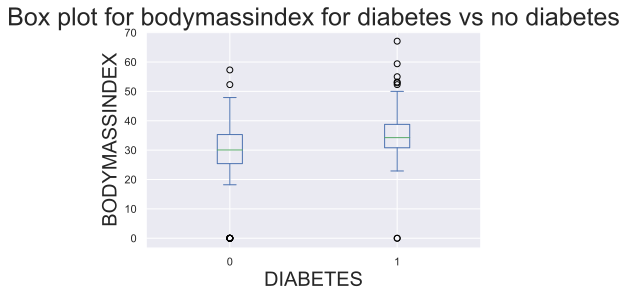

In [87]:
# Boxplot
bodymassindex_boxplt = boxplt('BODYMASSINDEX', 'Box plot for bodymassindex for diabetes vs no diabetes')

In [88]:
# Outliers
bodymassindex_outl = outliers(diabetes.BODYMASSINDEX)
bodymassindex_outl

Rango intercuartílico: 9.3
Lower and upper outlier limits: 13.35 ,  50.550000000000004
We have a total of 19 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
9,8,125,96,0,0,0.0,0.232,54,1
49,7,105,0,0,0,0.0,0.305,24,0
60,2,84,0,0,0,0.0,0.304,21,0
81,2,74,0,0,0,0.0,0.102,22,0
120,0,162,76,56,100,53.2,0.759,25,1
125,1,88,30,42,99,55.0,0.496,26,1
145,0,102,75,23,0,0.0,0.572,21,0
177,0,129,110,46,130,67.1,0.319,26,1
193,11,135,0,0,0,52.3,0.578,40,1
247,0,165,90,33,680,52.3,0.427,23,0


La variable `BODYMASSINDEX` indica el índice de masa corporal, que se mide teniendo en cuenta el peso y la altura de cada persona. 

Hay 11 casos en los que el `BODYMASSINDEX` es igual a 0, esto significaría que la persona carecería de masa corporal, lo cual es imposible. 

Por ambas razones, hemos decidido eliminar los outliers.

## INSULIN

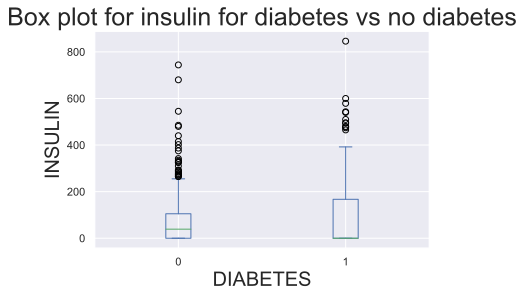

In [89]:
# Boxplot
insulin_boxplt = boxplt('INSULIN', 'Box plot for insulin for diabetes vs no diabetes')

In [90]:
# Outliers
insulin_outl = outliers(diabetes.INSULIN)
insulin_outl

Rango intercuartílico: 127.25
Lower and upper outlier limits: -190.875 ,  318.125
We have a total of 34 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
8,2,197,70,45,543,30.5,0.158,53,1
13,1,189,60,23,846,30.1,0.398,59,1
54,7,150,66,42,342,34.7,0.718,42,0
111,8,155,62,26,495,34.0,0.543,46,1
139,5,105,72,29,325,36.9,0.159,28,0
153,1,153,82,42,485,40.6,0.687,23,0
186,8,181,68,36,495,30.1,0.615,60,1
220,0,177,60,29,478,34.6,1.072,21,1
228,4,197,70,39,744,36.7,2.329,31,0
231,6,134,80,37,370,46.2,0.238,46,1


La variable `INSULINA`, lo normal es que sea de 5-26 U/ml. Por lo que en la gráfica de insulina es normal que haya tantos "outliers" alrededor del 0. 

## SKINTHICKNESS

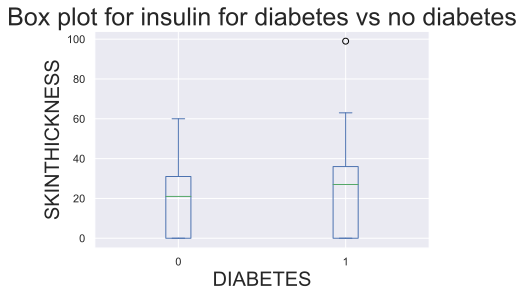

In [91]:
# Boxplot
skinthickness_boxplt = boxplt('SKINTHICKNESS', 'Box plot for insulin for diabetes vs no diabetes')

In [92]:
# Outliers
skinthickness_outl = outliers(diabetes.SKINTHICKNESS)
skinthickness_outl

Rango intercuartílico: 32.0
Lower and upper outlier limits: -48.0 ,  80.0
We have a total of 1 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
579,2,197,70,99,0,34.7,0.575,62,1


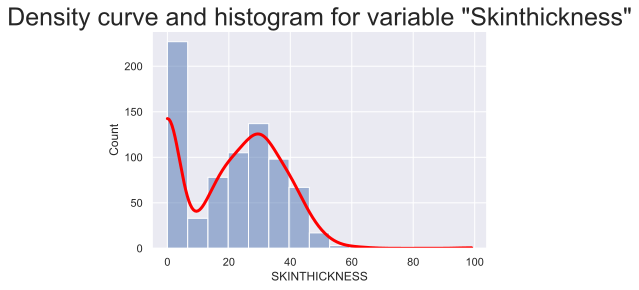

In [93]:
pregnant_histplt = hist_densplt('SKINTHICKNESS', 'Density curve and histogram for variable "Skinthickness"')

Para esta variable, vemos en las gráficas que tenemos un gran número de ceros. Esta medida no es un valor normal para medir el valor del grosor de la piel, por lo que suponemos que son medidas que no se tomaron en el momento de analizar al paciente.

## PEDIGREEFUNC

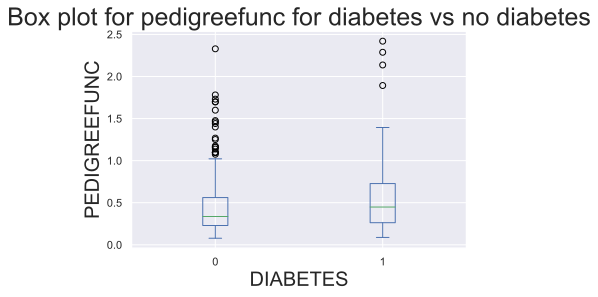

In [94]:
# Boxplot
pedigreefunc_boxplt = boxplt('PEDIGREEFUNC', 'Box plot for pedigreefunc for diabetes vs no diabetes')


In [95]:
# Outliers
pedigreefunc_outl = outliers(diabetes.PEDIGREEFUNC)
pedigreefunc_outl

Rango intercuartílico: 0.38249999999999995
Lower and upper outlier limits: -0.32999999999999996 ,  1.2
We have a total of 29 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
4,0,137,40,35,168,43.1,2.288,33,1
12,10,139,80,0,0,27.1,1.441,57,0
39,4,111,72,47,207,37.1,1.390,56,1
45,0,180,66,39,0,42.0,1.893,25,1
58,0,146,82,0,0,40.5,1.781,44,0
100,1,163,72,0,0,39.0,1.222,33,1
147,2,106,64,35,119,30.5,1.400,34,0
187,1,128,98,41,58,32.0,1.321,33,1
218,5,85,74,22,0,29.0,1.224,32,1
228,4,197,70,39,744,36.7,2.329,31,0


**TODO: FALTA CONCLUSIÓN PARA ESTA VARIABLE**

## AGE

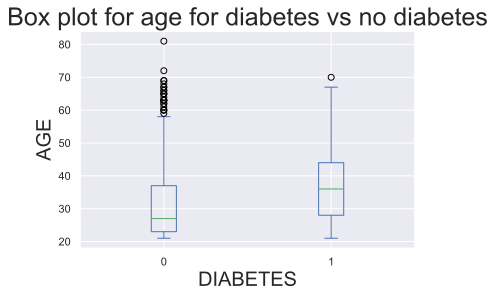

In [96]:
# Boxplot
age_boxplt = boxplt('AGE', 'Box plot for age for diabetes vs no diabetes')

In [97]:
# Outliers
age_outl = outliers(diabetes.AGE)
age_outl

Rango intercuartílico: 17.0
Lower and upper outlier limits: -1.5 ,  66.5
We have a total of 9 outliers


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,DIABETES
123,5,132,80,0,0,26.8,0.186,69,0
363,4,146,78,0,0,38.5,0.520,67,1
453,2,119,0,0,0,19.6,0.832,72,0
459,9,134,74,33,60,25.9,0.460,81,0
489,8,194,80,0,0,26.1,0.551,67,0
537,0,57,60,0,0,21.7,0.735,67,0
666,4,145,82,18,0,32.5,0.235,70,1
674,8,91,82,0,0,35.6,0.587,68,0
684,5,136,82,0,0,0.0,0.640,69,0


**TODO: FALTA CONCLUSIÓN PARA ESTA VARIABLE**

### STEP 4: ENCODE CATEGORICAL VARIABLES

In [98]:
#There are no categorical input variables, but 'DIABETES' would be a categorical value.
### Convert output variable to factor, in this case 'DIABETES' is a categorical variable.
diabetes.DIABETES = diabetes.DIABETES.astype('category') 
diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   PREGNANT       768 non-null    int64   
 1   GLUCOSE        768 non-null    int64   
 2   BLOODPRESS     768 non-null    int64   
 3   SKINTHICKNESS  768 non-null    int64   
 4   INSULIN        768 non-null    int64   
 5   BODYMASSINDEX  768 non-null    float64 
 6   PEDIGREEFUNC   768 non-null    float64 
 7   AGE            768 non-null    int64   
 8   DIABETES       768 non-null    category
dtypes: category(1), float64(2), int64(6)
memory usage: 49.0 KB


### STEP 5: EXPLORATORY ANALYSIS
Correlation plot of numeric variables

In [99]:
# Scatterplot all vs all
sns.pairplot(diabetes, hue = 'DIABETES')
plt.show()

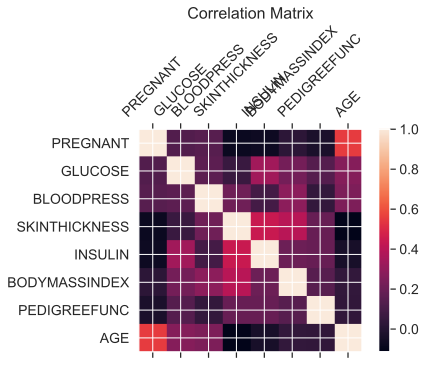

In [100]:
### Exploratory analysis -------------------------------------------------------------------------------------
#correlation plot of numeric variables
#Lo que nos interesa es tener variables que sean muy diferentes entre ellas.
f = plt.figure()
plt.matshow(diabetes.select_dtypes(include=['int64','float64']).corr(), fignum=f.number)
plt.xticks(range(diabetes.select_dtypes(include=['int64','float64']).shape[1]), diabetes.select_dtypes(include=['int64','float64']).columns, fontsize=14, rotation=45)
plt.yticks(range(diabetes.select_dtypes(include=['int64','float64']).shape[1]), diabetes.select_dtypes(include=['int64','float64']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16)
plt.show()

Una vez detectada la correlacion entre las variables y la importancia que tienen para el dataset (Cuanto más correladas estén entre ellas, menos informacion aportarán a nuestro modelo) podemos eliminar los outliers que hemos detectado anteriormente en las variables indicadas.

In [104]:
# Eliminamos los outliers de BMI
drop_outliers(bodymassindex_outl)

Outliers deleted.


In [105]:
# Eliminamos los outliers de Bloodpress
drop_outliers(bloodpress_outl)

Outliers deleted.


In [106]:
# Eliminamos los outliers de Skinthickness
drop_outliers(skinthickness_outl)

Outliers deleted.


In [107]:
# Eliminamos los outliers de Glucose
drop_outliers(glucose_outl)

Outliers deleted.


### STEP 6: CHECK OUT FOR CLASS IMBALANCES

In [108]:
# Class count -- vemos que está desbalanceado
diabetes.DIABETES.value_counts()

0    468
1    240
Name: DIABETES, dtype: int64

Como podemos ver en la tabla de frecuencias de la variable salida, hay muchos más registros de la clase 0 que de la clase 1. 

Para balancear las clases, vamos a usar la librería **[imblearn](https://imbalanced-learn.org/stable/references/generated/imblearn.over_sampling.SMOTE.html)**, en concreto, el método de oversampling llamado SMOTE. Este método genera datos sintéticos de la clase minoritaria, para obtener muestras similares a nuestros datos y conseguir balancear las clases del dataset.

<img src='./fig/imblearn_example.png' style= 'width:300mm'>


In [109]:
# import library
from imblearn.over_sampling import SMOTE
smote = SMOTE()

x = diabetes.loc[:, diabetes.columns != 'DIABETES']
y = diabetes.DIABETES
# fit predictor and target variable
x_smote, y_smote = smote.fit_resample(x, y)
print('Original dataset shape', len(y))
print('Resample dataset shape', len(y_smote))
diabetes_new = x_smote
diabetes_new['DIABETES']=y_smote
# Comprobamos que las métricas de las variables numéricas se mantienen 
#aproximadamente similares tras el oversampling
diabetes_new.describe()

Original dataset shape 708
Resample dataset shape 936


,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE
count,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000,936.000000
mean,4.026709,125.748932,72.487179,21.726496,92.506410,32.746402,0.490240,34.127137
std,3.347332,30.693064,11.092602,15.207583,123.581846,6.168516,0.316590,11.347400
min,0.000000,44.000000,38.000000,0.000000,0.000000,18.200000,0.078000,21.000000
25%,1.000000,102.000000,64.750000,0.000000,0.000000,28.400000,0.258000,25.000000
50%,3.000000,122.000000,72.000000,26.000000,53.000000,32.838570,0.406966,31.000000
75%,6.000000,147.000000,80.000000,33.000000,148.250000,36.500000,0.654000,42.000000
max,17.000000,199.000000,106.000000,60.000000,846.000000,50.000000,2.329000,81.000000


### Split the data into train and test

In [112]:
# Define input and output matrices
INPUTS = ['PREGNANT','GLUCOSE','BLOODPRESS','SKINTHICKNESS','INSULIN','BODYMASSINDEX','PEDIGREEFUNC','AGE']
OUTPUT = 'DIABETES'
X = diabetes[INPUTS]
y = diabetes[OUTPUT]
X_new = diabetes_new[INPUTS]
y_new = diabetes_new[OUTPUT]

 

# Split
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2,  #percentage of test data 20%
                                                    random_state=0, #seed for replication, es para que me salga la =
                                                    stratify = y)   #Preserves distribution of y

# Split
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new,
                                                    test_size=0.2,  #percentage of test data 20%
                                                    random_state=0, #seed for replication, es para que me salga la =
                                                    stratify = y_new)   #Preserves distribution of y

## 2. Training of Machine Learning models

Vamos a comenzar generando un árbol de decisión, para que nos detecte las variables más significativas de nuestro modelo y podamos hacer pruebas con varias de ellas.

Para este paso, vamos a hacer pruebas con los dos datasets que tenemos:
+ El dataset original, con todos los datos con outliers y desbalanceo de clases
+ El dataset preparado, sin outliers y con clases balanceadas

**Prueba con el dataset original**

In [113]:
## Create dataset to store model predictions
dfTR_eval = X_train.copy()
dfTR_eval['Y'] = y_train # We will call Y as output variable for simplicity
dfTS_eval = X_test.copy()
dfTS_eval['Y'] = y_test # We will call Y as output variable for simplicity>

In [116]:
#-------------------------------------------------------------------------------------------------
#---------------------------- DECISION TREE MODEL ------------------------------------------------
#-------------------------------------------------------------------------------------------------
## Inputs of the model. Change accordingly to perform variable selection
INPUTS_DT = INPUTS

param = {'DT__min_impurity_decrease': np.arange(0,0.05,0.005)} # Minimum entropy to decrease in each split. Valor que vamos a usar para la validación cruzada. Los porcentajes de mejora varían en funcion del problema
pipe = Pipeline(steps=[('scaler', StandardScaler()), 
                       ('DT', DecisionTreeClassifier(criterion='gini',  # impuriry measure
                                                     min_samples_split=5, # Minimum number of obs in node to keep cutting. minimo numero de muestras en un split
                                                     min_samples_leaf=5, # Minimum number of obs in a terminal node. minimo numero de muestras en un nodo terminal.
                                                     random_state=150))]) # For replication

# We use Grid Search Cross Validation to find the best parameter for the model in the grid defined 
nFolds = 10
# el arbol lo vamos a obtener mediante grid search
tree_fit = GridSearchCV(estimator=pipe, # Structure of the model to use
                       param_grid=param, # Defined grid to search in
                       n_jobs=-1, # Number of cores to use (parallelize)
                       scoring='accuracy', # Accuracy https://scikit-learn.org/stable/modules/model_evaluation.html
                       cv=nFolds) # Number of Folds 
tree_fit.fit(X_train[INPUTS_DT], y_train) # Search in grid

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('DT',
                                        DecisionTreeClassifier(min_samples_leaf=5,
                                                               min_samples_split=5,
                                                               random_state=150))]),
             n_jobs=-1,
             param_grid={'DT__min_impurity_decrease': array([0.   , 0.005, 0.01 , 0.015, 0.02 , 0.025, 0.03 , 0.035, 0.04 ,
       0.045])},
             scoring='accuracy')

**FALTA INDICAR EL POR QUÉ DE LOS PARÁMETROS**

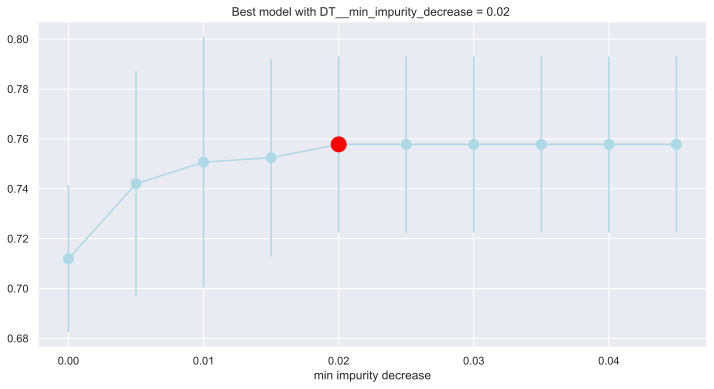

In [117]:
MT.plotModelGridError(tree_fit)

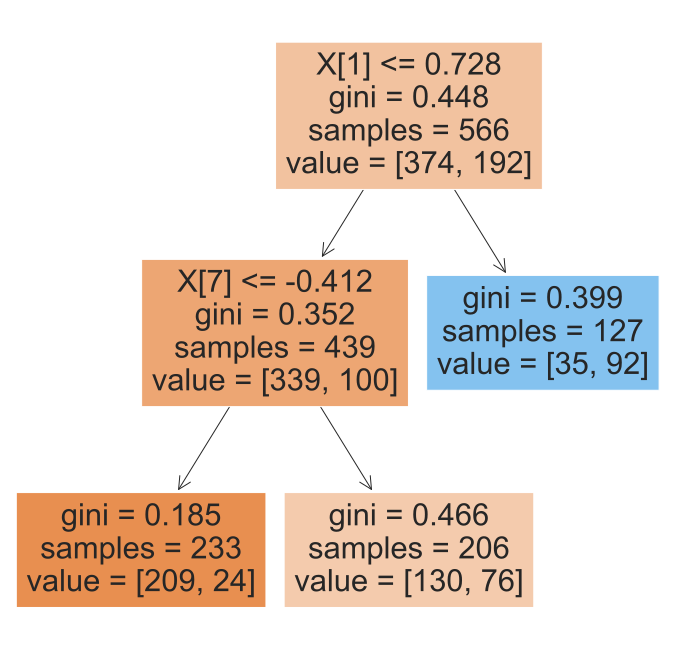

In [118]:
## Plot the decision tree model
plt.figure(figsize=(12, 12))
plot_tree(tree_fit.best_estimator_['DT'], filled=True)
plt.show()


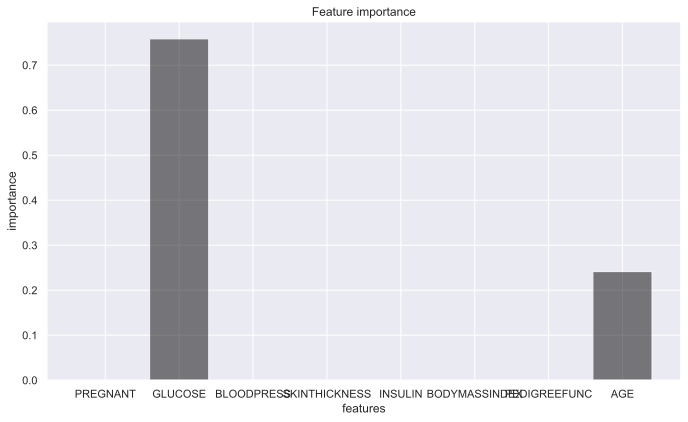

In [119]:
## Plot the variable importance of each feature
plt.figure(figsize=(6 * 1.618, 6))
index = np.arange(len(X_train[INPUTS_DT].columns))
bar_width = 0.35
plt.bar(index, tree_fit.best_estimator_['DT'].feature_importances_, color='black', alpha=0.5)
plt.xlabel('features')
plt.ylabel('importance')
plt.title('Feature importance')
plt.xticks(index, X_train[INPUTS_DT].columns)
plt.tight_layout()
plt.show()

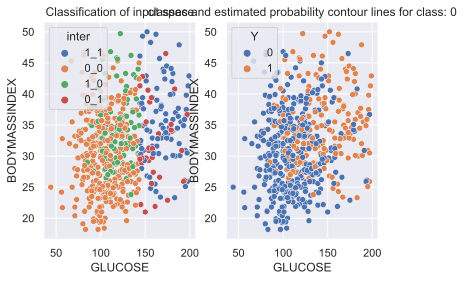

,PREGNANT,GLUCOSE,BLOODPRESS,SKINTHICKNESS,INSULIN,BODYMASSINDEX,PEDIGREEFUNC,AGE,Y,Y_DT_pred,Y_DT_prob_neg,Y_DT_prob_pos
675,6,195,70,0,0,30.9,0.328,31,1,1,0.275591,0.724409
33,6,92,92,0,0,19.9,0.188,28,0,0,0.896996,0.103004
582,12,121,78,17,0,26.5,0.259,62,0,0,0.631068,0.368932
137,0,93,60,25,92,28.7,0.532,22,0,0,0.896996,0.103004
451,2,134,70,0,0,28.9,0.542,23,1,0,0.896996,0.103004


In [120]:
##  Obtain a report of the model based on predictions ---------------------------------------------
dfTR_eval['Y_DT_pred'] = tree_fit.predict(X_train[INPUTS_DT])
dfTR_eval['Y_DT_prob_neg'] = tree_fit.predict_proba(X_train[INPUTS_DT])[:,0]
dfTR_eval['Y_DT_prob_pos'] = tree_fit.predict_proba(X_train[INPUTS_DT])[:,1]
### Scale test using preprocess in training
dfTS_eval['Y_DT_pred'] = tree_fit.predict(X_test[INPUTS_DT])
dfTS_eval['Y_DT_prob_neg'] = tree_fit.predict_proba(X_test[INPUTS_DT])[:,0]
dfTS_eval['Y_DT_prob_pos'] = tree_fit.predict_proba(X_test[INPUTS_DT])[:,1]

#visualize evaluated data
dfTR_eval.head()
CT.plot2DClass(X_train[INPUTS_DT], dfTR_eval['Y'], tree_fit, 'GLUCOSE', 'BODYMASSINDEX', '0', 50)
dfTR_eval.head()

In [122]:
CT.confusion_matrix(dfTR_eval['Y'], dfTR_eval['Y_DT_pred'], labels=['0','1'])

Confusion Matrix and Statistics
	   Prediction
Reference  0  1
        0  0  0
        1  0  0


C:\Users\marti\anaconda3\envs\ml\lib\site-packages\sklearn\metrics\_classification.py:648: RuntimeWarning: invalid value encountered in true_divide
  expected = np.outer(sum0, sum1) / np.sum(sum0)


ValueError: pos_label=0 is not a valid label. It should be one of [0, 1]